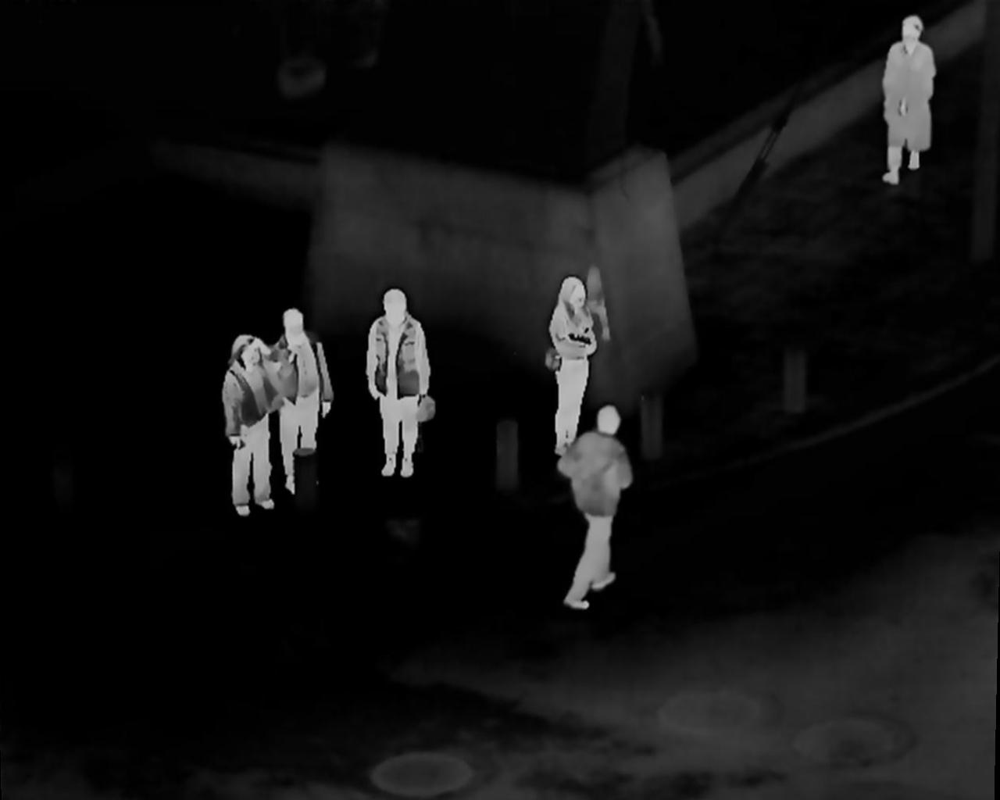

In [20]:
from IPython.display import Image

# Replace 'image_path.jpg' with the path to your image file
image_path = r'D:\GAN\final dataset\infrared train\010001.jpg'

# Display the image
Image(filename=image_path)


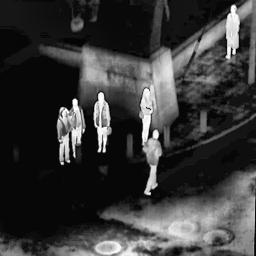

In [21]:
from IPython.display import Image

# Replace 'image_path.jpg' with the path to your image file
image_path = r'D:\GAN\final dataset\infrared train preprocessed\010001.jpg'

# Display the image
Image(filename=image_path)


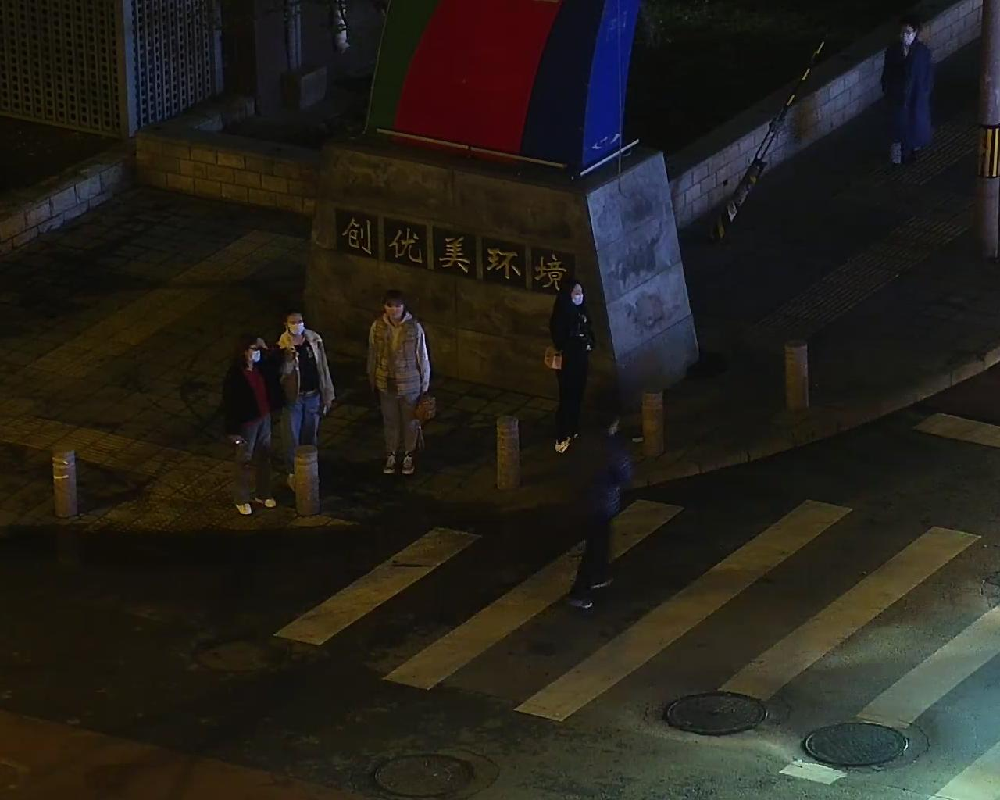

In [22]:
from IPython.display import Image

# Replace 'image_path.jpg' with the path to your image file
image_path = r'D:\GAN\final dataset\visible train\010001.jpg'

# Display the image
Image(filename=image_path)


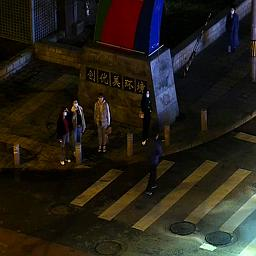

In [23]:
from IPython.display import Image

# Replace 'image_path.jpg' with the path to your image file
image_path = r'D:\GAN\final dataset\visible train preprocessed\010001.jpg'

# Display the image
Image(filename=image_path)

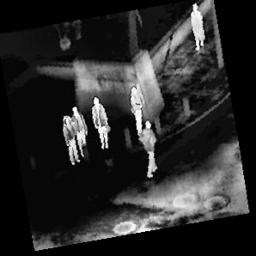

In [24]:
from IPython.display import Image

# Replace 'image_path.jpg' with the path to your image file
image_path = r'D:\GAN\final dataset\unregistered train\010001.jpg'

# Display the image
Image(filename=image_path)


In [25]:
pip install opencv-python-headless

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\admin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [26]:
pip install tqdm


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\admin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [27]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
import os
from tqdm import tqdm
import torch.optim as optim
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
num_output_features = 4
feature_extractor_output_features=65536


In [28]:
class ChannelAttentionModule(nn.Module):
    def __init__(self, num_channels, reduction_ratio=16):
        super(ChannelAttentionModule, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc = nn.Sequential(
            nn.Conv2d(num_channels, num_channels // reduction_ratio, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(num_channels // reduction_ratio, num_channels, 1, bias=False)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        out = avg_out + max_out
        return self.sigmoid(out)


In [29]:
class SpatialAttentionModule(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttentionModule, self).__init__()
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1)
        x = self.conv1(x)
        return self.sigmoid(x)

In [30]:

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(channels),
        )

    def forward(self, x):
        return x + self.block(x)  # Residual connection


In [31]:

class Generator(nn.Module):
    def __init__(self, input_channels=4):
        super(Generator, self).__init__()

        # Encoder: Downsample input images (Visible + Infrared)
        self.encoder = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel_size=4, stride=2, padding=1),  # [B, 4, H, W] -> [B, 64, H/2, W/2]
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # [B, 64, H/2, W/2] -> [B, 128, H/4, W/4]
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # [B, 128, H/4, W/4] -> [B, 256, H/8, W/8]
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        # Residual blocks in the bottleneck
        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(256) for _ in range(4)]  # Add 4 residual blocks
        )

        # Attention mechanisms
        self.channel_attention = ChannelAttentionModule(256)
        self.spatial_attention = SpatialAttentionModule()

        # Decoder: Upsample features to generate aligned infrared image
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # [B, 256, H/8, W/8] -> [B, 128, H/4, W/4]
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # [B, 128, H/4, W/4] -> [B, 64, H/2, W/2]
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 1, kernel_size=4, stride=2, padding=1),  # [B, 64, H/2, W/2] -> [B, 1, H, W]
            nn.Tanh()
        )

    def forward(self, visible, infrared):
        # Concatenate visible and infrared inputs along the channel dimension
        x = torch.cat([visible, infrared], dim=1)  # [B, 4, H, W]

        # Encoder
        x = self.encoder(x)
        x = self.residual_blocks(x)
        # Attention mechanisms
        x = self.channel_attention(x) * x
        x = self.spatial_attention(x) * x

        # Decoder
        aligned_infrared = self.decoder(x)

        return aligned_infrared


In [32]:

import torch.nn.functional as F

class Discriminator(nn.Module):
    def __init__(self, input_channels=4):
        super(Discriminator, self).__init__()

        def discriminator_block(in_channels, out_channels, stride=2, normalize=True):
            """Discriminator block: Conv2d -> (Optional) BatchNorm -> LeakyReLU."""
            layers = [nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=stride, padding=1)]
            if normalize:
                layers.append(nn.BatchNorm2d(out_channels))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return nn.Sequential(*layers)

        # PatchGAN-like discriminator
        self.model = nn.Sequential(
            discriminator_block(input_channels, 64, normalize=False),  # [B, 4, H, W] -> [B, 64, H/2, W/2]
            discriminator_block(64, 128),                              # [B, 64, H/2, W/2] -> [B, 128, H/4, W/4]
            discriminator_block(128, 256),                            # [B, 128, H/4, W/4] -> [B, 256, H/8, W/8]
            discriminator_block(256, 512, stride=1),                  # [B, 256, H/8, W/8] -> [B, 512, H/8, W/8]
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1),    # [B, 512, H/8, W/8] -> [B, 1, H/8, W/8]
        )

        # Add Sigmoid activation for probability output
        self.sigmoid = nn.Sigmoid()

    def forward(self, visible, infrared):
        # Concatenate visible and infrared images
        x = torch.cat([visible, infrared], dim=1)  # [B, 4, H, W]

         # Pass through the discriminator
        x = self.model(x)
        validity = self.sigmoid(x)  # Apply Sigmoid

        return validity

In [33]:

from torchvision.models import vgg16
# Perceptual Loss using VGG16
class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        vgg = vgg16(pretrained=True).features[:16]  # Use first few layers
        self.vgg = nn.Sequential(*list(vgg.children())).eval()  # Freeze weights
        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, generated, target):
        # Ensure input is 3-channel by repeating the single channel
        if generated.size(1) == 1:  # If grayscale, convert to 3-channel
            generated = generated.repeat(1, 3, 1, 1)
            target = target.repeat(1, 3, 1, 1)

        gen_features = self.vgg(generated)
        target_features = self.vgg(target)
        return F.l1_loss(gen_features, target_features)

# Edge Loss for sharpness
def edge_loss(generated, target):
    sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]).view(1, 1, 3, 3).to(generated.device)
    sobel_y = sobel_x.permute(0, 1, 3, 2)
    edges_gen = F.conv2d(generated, sobel_x) + F.conv2d(generated, sobel_y)
    edges_target = F.conv2d(target, sobel_x) + F.conv2d(target, sobel_y)
    return F.l1_loss(edges_gen, edges_target)


In [34]:

from glob import glob
from PIL import Image

# Paths to your datasets
visible_image_dir = r'D:\GAN\final dataset\visible train preprocessed'
infrared_image_dir = r'D:\GAN\final dataset\unregistered train'  #unregistered
aligned_infrared_image_dir = r'D:\GAN\final dataset\infrared train preprocessed' #GT

# Collect file paths
visible_images = sorted(glob(os.path.join(visible_image_dir, '*.jpg')))
infrared_images = sorted(glob(os.path.join(infrared_image_dir, '*.jpg')))
aligned_infrared_images = sorted(glob(os.path.join(aligned_infrared_image_dir, '*.jpg')))

# Ensure the lengths of all lists match
assert len(visible_images) == len(infrared_images) == len(aligned_infrared_images), \
    "Mismatch in dataset sizes!"

print(f"Number of visible images: {len(visible_images)}")
print(f"Number of unaligned infrared images: {len(infrared_images)}")
print(f"Number of aligned infrared images: {len(aligned_infrared_images)}")

import matplotlib.pyplot as plt

# Load the sample image
sample_visible_image = Image.open(visible_images[0])
print('Visible Train')
print(sample_visible_image.format)  # Should print 'JPEG', 'PNG', etc.
print(sample_visible_image.size)    # Prints the image size (width, height)

sample_aligned_infrared_image = Image.open(aligned_infrared_images[0])
print('Aligned Infrared Train(GT)')
print(sample_aligned_infrared_image.format)  # Should print 'JPEG', 'PNG', etc.
print(sample_aligned_infrared_image.size)    # Prints the image size (width, height)

sample_infrared_image = Image.open(infrared_images[0])
print('unregistered ir')
print(sample_infrared_image.format)  # Should print 'JPEG', 'PNG', etc.
print(sample_infrared_image.size)    # Prints the image size (width, height)


Number of visible images: 1097
Number of unaligned infrared images: 1097
Number of aligned infrared images: 1097
Visible Train
JPEG
(256, 256)
Aligned Infrared Train(GT)
JPEG
(256, 256)
unregistered ir
JPEG
(256, 256)


In [35]:

class ImageRegistrationDataset(Dataset):
    def __init__(self, visible_images, infrared_images, aligned_infrared_images, transform=None):
        self.visible_images = visible_images
        self.infrared_images = infrared_images
        self.aligned_infrared_images = aligned_infrared_images
        self.transform = transform

    def __len__(self):
        return len(self.visible_images)

    def __getitem__(self, idx):
        if isinstance(self.visible_images[idx], str):  # If paths are provided
            visible = Image.open(self.visible_images[idx]).convert('RGB')
            infrared = Image.open(self.infrared_images[idx]).convert('L')
            aligned_infrared = Image.open(self.aligned_infrared_images[idx]).convert('L')
        else:  # If tensors are provided
            visible = self.visible_images[idx]
            infrared = self.infrared_images[idx]
            aligned_infrared = self.aligned_infrared_images[idx]

        if self.transform:
            visible = self.transform(visible)
            infrared = self.transform(infrared)
            aligned_infrared = self.transform(aligned_infrared)

        return visible, infrared, aligned_infrared



In [36]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize to range [-1, 1]
])

In [37]:

# Initialize the generator and discriminator
generator = Generator()
discriminator = Discriminator()

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move models to the appropriate device
generator.to(device)
discriminator.to(device)

# Print the models' summaries to verify architecture (optional)
print(generator)
print(discriminator)

Generator(
  (encoder): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
  )
  (residual_blocks): Sequential(
    (0): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

In [38]:
import os
from torchvision.utils import save_image
from tqdm import tqdm

# Define save directory for generated images
save_dir = r'D:\GAN\final dataset\generated train'
os.makedirs(save_dir, exist_ok=True)

# Generator, Discriminator, and Loss setup (unchanged)
generator = Generator().to(device)
discriminator = Discriminator().to(device)  # Assume discriminator is unchanged
adversarial_loss = nn.BCEWithLogitsLoss()
reconstruction_loss = nn.L1Loss()
perceptual_loss = PerceptualLoss().to(device)

# Training parameters
num_epochs = 200
batch_size = 4

# DataLoader setup
train_dataset = ImageRegistrationDataset(
    visible_images, infrared_images, aligned_infrared_images, transform=transform
)
train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, pin_memory=True, num_workers=0  # Use 0 for debugging
)

# Optimizer and scheduler
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
scheduler_G = optim.lr_scheduler.StepLR(optimizer_G, step_size=5, gamma=0.5)
scheduler_D = optim.lr_scheduler.StepLR(optimizer_D, step_size=5, gamma=0.5)

# Training loop
for epoch in range(num_epochs):
    generator.train()
    discriminator.train()

    epoch_g_loss = 0.0
    epoch_d_loss = 0.0

    for batch_idx, (visible, infrared, aligned_infrared) in enumerate(tqdm(train_loader)):
        visible, infrared, aligned_infrared = visible.to(device), infrared.to(device), aligned_infrared.to(device)

        # Train Discriminator
        optimizer_D.zero_grad()
        real_preds = discriminator(visible, aligned_infrared)
        real_loss = adversarial_loss(real_preds, torch.ones_like(real_preds))
        generated_infrared = generator(visible, infrared)
        fake_preds = discriminator(visible, generated_infrared.detach())
        fake_loss = adversarial_loss(fake_preds, torch.zeros_like(fake_preds))
        d_loss = (real_loss + fake_loss) / 2
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()
        fake_preds = discriminator(visible, generated_infrared)
        g_adv_loss = adversarial_loss(fake_preds, torch.ones_like(fake_preds))
        g_rec_loss = reconstruction_loss(generated_infrared, aligned_infrared)
        g_perc_loss = perceptual_loss(generated_infrared, aligned_infrared)
        g_loss = g_adv_loss + 100 * g_rec_loss + 10 * g_perc_loss
        g_loss.backward()
        optimizer_G.step()

        epoch_g_loss += g_loss.item()
        epoch_d_loss += d_loss.item()

        # Save generated images during training
        if (batch_idx % 10 == 0):  # Save every 10 batches
            for i in range(generated_infrared.size(0)):  # Save each image in the batch
                save_path = os.path.join(
                    save_dir, f"epoch{epoch+1}_batch{batch_idx+1}_img{i+1}.png"
                )
                save_image(generated_infrared[i], save_path)

    print(f"Epoch [{epoch+1}/{num_epochs}], Generator Loss: {epoch_g_loss:.4f}, Discriminator Loss: {epoch_d_loss:.4f}")
    scheduler_G.step()
    scheduler_D.step()

    # Save model checkpoints
    if (epoch + 1) % 20 == 0:
        torch.save(generator.state_dict(), f"generator_epoch_{epoch+1}.pth")
        torch.save(discriminator.state_dict(), f"discriminator_epoch_{epoch+1}.pth")


100%|██████████| 275/275 [08:06<00:00,  1.77s/it]


Epoch [1/200], Generator Loss: 10631.0108, Discriminator Loss: 156.4480


100%|██████████| 275/275 [07:40<00:00,  1.67s/it]


Epoch [2/200], Generator Loss: 7390.5370, Discriminator Loss: 143.2509


100%|██████████| 275/275 [07:40<00:00,  1.67s/it]


Epoch [3/200], Generator Loss: 5957.3640, Discriminator Loss: 177.8811


100%|██████████| 275/275 [07:42<00:00,  1.68s/it]


Epoch [4/200], Generator Loss: 5334.8852, Discriminator Loss: 159.4606


100%|██████████| 275/275 [07:40<00:00,  1.68s/it]


Epoch [5/200], Generator Loss: 5050.3743, Discriminator Loss: 148.0295


100%|██████████| 275/275 [07:40<00:00,  1.67s/it]


Epoch [6/200], Generator Loss: 4578.1509, Discriminator Loss: 139.5456


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [7/200], Generator Loss: 4379.9235, Discriminator Loss: 142.3835


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [8/200], Generator Loss: 4268.0552, Discriminator Loss: 143.5939


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [9/200], Generator Loss: 4139.4240, Discriminator Loss: 140.4144


100%|██████████| 275/275 [07:36<00:00,  1.66s/it]


Epoch [10/200], Generator Loss: 4079.5893, Discriminator Loss: 140.9176


100%|██████████| 275/275 [07:32<00:00,  1.64s/it]


Epoch [11/200], Generator Loss: 3810.9146, Discriminator Loss: 141.0113


100%|██████████| 275/275 [07:32<00:00,  1.64s/it]


Epoch [12/200], Generator Loss: 3745.6972, Discriminator Loss: 140.4947


100%|██████████| 275/275 [07:37<00:00,  1.66s/it]


Epoch [13/200], Generator Loss: 3689.2627, Discriminator Loss: 140.9095


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [14/200], Generator Loss: 3654.7773, Discriminator Loss: 139.9753


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [15/200], Generator Loss: 3608.4897, Discriminator Loss: 141.1117


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [16/200], Generator Loss: 3490.1880, Discriminator Loss: 140.6684


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [17/200], Generator Loss: 3460.7655, Discriminator Loss: 139.5676


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [18/200], Generator Loss: 3431.6304, Discriminator Loss: 139.2883


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [19/200], Generator Loss: 3492.1774, Discriminator Loss: 139.7420


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [20/200], Generator Loss: 3387.1626, Discriminator Loss: 140.8407


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [21/200], Generator Loss: 3331.0377, Discriminator Loss: 139.4057


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [22/200], Generator Loss: 3310.2894, Discriminator Loss: 140.0640


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [23/200], Generator Loss: 3297.6913, Discriminator Loss: 139.8263


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [24/200], Generator Loss: 3299.3426, Discriminator Loss: 139.0604


100%|██████████| 275/275 [07:39<00:00,  1.67s/it]


Epoch [25/200], Generator Loss: 3277.1331, Discriminator Loss: 139.5058


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [26/200], Generator Loss: 3247.1327, Discriminator Loss: 140.1631


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [27/200], Generator Loss: 3233.3629, Discriminator Loss: 141.9026


100%|██████████| 275/275 [07:24<00:00,  1.61s/it]


Epoch [28/200], Generator Loss: 3230.8719, Discriminator Loss: 142.0715


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [29/200], Generator Loss: 3224.4350, Discriminator Loss: 143.5585


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [30/200], Generator Loss: 3213.4073, Discriminator Loss: 142.4326


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [31/200], Generator Loss: 3198.3513, Discriminator Loss: 142.8692


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [32/200], Generator Loss: 3194.7775, Discriminator Loss: 145.4491


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [33/200], Generator Loss: 3188.1326, Discriminator Loss: 148.6674


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [34/200], Generator Loss: 3189.2610, Discriminator Loss: 144.4888


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [35/200], Generator Loss: 3181.8023, Discriminator Loss: 148.1705


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [36/200], Generator Loss: 3158.1580, Discriminator Loss: 164.2123


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [37/200], Generator Loss: 3154.6949, Discriminator Loss: 172.3541


100%|██████████| 275/275 [07:23<00:00,  1.61s/it]


Epoch [38/200], Generator Loss: 3153.9811, Discriminator Loss: 174.8720


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [39/200], Generator Loss: 3158.7933, Discriminator Loss: 174.1496


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [40/200], Generator Loss: 3152.9761, Discriminator Loss: 175.3570


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [41/200], Generator Loss: 3151.6127, Discriminator Loss: 178.8001


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [42/200], Generator Loss: 3152.3579, Discriminator Loss: 177.5526


100%|██████████| 275/275 [07:22<00:00,  1.61s/it]


Epoch [43/200], Generator Loss: 3147.1776, Discriminator Loss: 179.4473


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [44/200], Generator Loss: 3158.7086, Discriminator Loss: 178.0646


100%|██████████| 275/275 [07:20<00:00,  1.60s/it]


Epoch [45/200], Generator Loss: 3149.4754, Discriminator Loss: 177.6252


100%|██████████| 275/275 [07:19<00:00,  1.60s/it]


Epoch [46/200], Generator Loss: 3144.5502, Discriminator Loss: 177.2957


100%|██████████| 275/275 [07:18<00:00,  1.59s/it]


Epoch [47/200], Generator Loss: 3148.0267, Discriminator Loss: 177.9692


100%|██████████| 275/275 [07:21<00:00,  1.61s/it]


Epoch [48/200], Generator Loss: 3146.0199, Discriminator Loss: 176.8772


100%|██████████| 275/275 [07:19<00:00,  1.60s/it]


Epoch [49/200], Generator Loss: 3149.2074, Discriminator Loss: 176.1641


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [50/200], Generator Loss: 3145.4118, Discriminator Loss: 177.5030


100%|██████████| 275/275 [07:32<00:00,  1.64s/it]


Epoch [51/200], Generator Loss: 3147.4622, Discriminator Loss: 176.7689


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [52/200], Generator Loss: 3141.8871, Discriminator Loss: 178.6699


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [53/200], Generator Loss: 3144.4015, Discriminator Loss: 178.9005


100%|██████████| 275/275 [07:37<00:00,  1.66s/it]


Epoch [54/200], Generator Loss: 3140.0912, Discriminator Loss: 178.2349


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [55/200], Generator Loss: 3142.2986, Discriminator Loss: 178.3432


100%|██████████| 275/275 [07:23<00:00,  1.61s/it]


Epoch [56/200], Generator Loss: 3145.5172, Discriminator Loss: 177.8508


100%|██████████| 275/275 [07:21<00:00,  1.60s/it]


Epoch [57/200], Generator Loss: 3148.1700, Discriminator Loss: 177.1826


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [58/200], Generator Loss: 3143.4632, Discriminator Loss: 178.6491


100%|██████████| 275/275 [07:29<00:00,  1.64s/it]


Epoch [59/200], Generator Loss: 3146.3188, Discriminator Loss: 176.5821


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [60/200], Generator Loss: 3144.7671, Discriminator Loss: 177.6741


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [61/200], Generator Loss: 3146.2220, Discriminator Loss: 176.7471


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [62/200], Generator Loss: 3146.5277, Discriminator Loss: 177.6712


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [63/200], Generator Loss: 3141.1949, Discriminator Loss: 176.8574


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [64/200], Generator Loss: 3141.9244, Discriminator Loss: 177.3933


100%|██████████| 275/275 [07:18<00:00,  1.60s/it]


Epoch [65/200], Generator Loss: 3142.6807, Discriminator Loss: 178.1029


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [66/200], Generator Loss: 3149.7186, Discriminator Loss: 178.4628


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [67/200], Generator Loss: 3143.3310, Discriminator Loss: 177.3508


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [68/200], Generator Loss: 3142.6961, Discriminator Loss: 178.4761


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [69/200], Generator Loss: 3143.6765, Discriminator Loss: 178.0477


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [70/200], Generator Loss: 3151.8555, Discriminator Loss: 177.1302


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [71/200], Generator Loss: 3143.1898, Discriminator Loss: 177.3642


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [72/200], Generator Loss: 3137.5152, Discriminator Loss: 177.8472


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [73/200], Generator Loss: 3144.3880, Discriminator Loss: 179.3831


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [74/200], Generator Loss: 3144.7805, Discriminator Loss: 177.2980


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [75/200], Generator Loss: 3145.5618, Discriminator Loss: 177.8102


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [76/200], Generator Loss: 3146.6368, Discriminator Loss: 176.2298


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [77/200], Generator Loss: 3143.1372, Discriminator Loss: 177.1652


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [78/200], Generator Loss: 3145.4009, Discriminator Loss: 175.9182


100%|██████████| 275/275 [07:37<00:00,  1.66s/it]


Epoch [79/200], Generator Loss: 3145.4772, Discriminator Loss: 176.8674


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [80/200], Generator Loss: 3143.5446, Discriminator Loss: 176.0151


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [81/200], Generator Loss: 3143.3054, Discriminator Loss: 176.6186


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [82/200], Generator Loss: 3143.9794, Discriminator Loss: 176.0340


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [83/200], Generator Loss: 3141.7054, Discriminator Loss: 176.1926


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [84/200], Generator Loss: 3145.4330, Discriminator Loss: 177.6032


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [85/200], Generator Loss: 3145.1500, Discriminator Loss: 178.2033


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [86/200], Generator Loss: 3144.6410, Discriminator Loss: 176.7982


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [87/200], Generator Loss: 3142.1189, Discriminator Loss: 176.9822


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [88/200], Generator Loss: 3140.0507, Discriminator Loss: 178.2156


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [89/200], Generator Loss: 3147.9210, Discriminator Loss: 176.3276


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [90/200], Generator Loss: 3144.2530, Discriminator Loss: 177.1056


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [91/200], Generator Loss: 3142.5312, Discriminator Loss: 177.2034


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [92/200], Generator Loss: 3142.1589, Discriminator Loss: 177.8379


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [93/200], Generator Loss: 3149.2723, Discriminator Loss: 176.1548


100%|██████████| 275/275 [07:21<00:00,  1.61s/it]


Epoch [94/200], Generator Loss: 3145.3868, Discriminator Loss: 176.4932


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [95/200], Generator Loss: 3142.9366, Discriminator Loss: 178.3266


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [96/200], Generator Loss: 3146.2734, Discriminator Loss: 176.5509


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [97/200], Generator Loss: 3150.5580, Discriminator Loss: 176.1016


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [98/200], Generator Loss: 3149.0854, Discriminator Loss: 176.5641


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [99/200], Generator Loss: 3141.1937, Discriminator Loss: 177.4967


100%|██████████| 275/275 [07:37<00:00,  1.66s/it]


Epoch [100/200], Generator Loss: 3141.4372, Discriminator Loss: 177.1678


100%|██████████| 275/275 [07:29<00:00,  1.64s/it]


Epoch [101/200], Generator Loss: 3145.1659, Discriminator Loss: 176.8970


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [102/200], Generator Loss: 3153.6747, Discriminator Loss: 176.5622


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [103/200], Generator Loss: 3144.9949, Discriminator Loss: 177.3693


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [104/200], Generator Loss: 3158.6580, Discriminator Loss: 176.3165


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [105/200], Generator Loss: 3142.4886, Discriminator Loss: 177.9069


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [106/200], Generator Loss: 3146.6199, Discriminator Loss: 176.7522


100%|██████████| 275/275 [07:29<00:00,  1.64s/it]


Epoch [107/200], Generator Loss: 3143.9542, Discriminator Loss: 177.2453


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [108/200], Generator Loss: 3147.2197, Discriminator Loss: 176.6511


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [109/200], Generator Loss: 3140.4749, Discriminator Loss: 177.3091


100%|██████████| 275/275 [07:24<00:00,  1.62s/it]


Epoch [110/200], Generator Loss: 3141.9075, Discriminator Loss: 177.8382


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [111/200], Generator Loss: 3143.0413, Discriminator Loss: 178.2675


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [112/200], Generator Loss: 3145.5337, Discriminator Loss: 176.5068


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [113/200], Generator Loss: 3143.3182, Discriminator Loss: 176.7299


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [114/200], Generator Loss: 3142.0686, Discriminator Loss: 177.1517


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [115/200], Generator Loss: 3144.3693, Discriminator Loss: 177.6738


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [116/200], Generator Loss: 3144.6005, Discriminator Loss: 177.4448


100%|██████████| 275/275 [07:32<00:00,  1.64s/it]


Epoch [117/200], Generator Loss: 3155.5443, Discriminator Loss: 176.1566


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [118/200], Generator Loss: 3146.0830, Discriminator Loss: 178.8548


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [119/200], Generator Loss: 3142.1211, Discriminator Loss: 176.5021


100%|██████████| 275/275 [07:23<00:00,  1.61s/it]


Epoch [120/200], Generator Loss: 3137.7722, Discriminator Loss: 178.6241


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [121/200], Generator Loss: 3145.6428, Discriminator Loss: 177.8209


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [122/200], Generator Loss: 3142.7507, Discriminator Loss: 176.6562


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [123/200], Generator Loss: 3144.6540, Discriminator Loss: 176.4007


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [124/200], Generator Loss: 3142.3142, Discriminator Loss: 177.8554


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [125/200], Generator Loss: 3141.9998, Discriminator Loss: 177.4634


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [126/200], Generator Loss: 3144.3339, Discriminator Loss: 177.9340


100%|██████████| 275/275 [07:17<00:00,  1.59s/it]


Epoch [127/200], Generator Loss: 3143.4489, Discriminator Loss: 177.3745


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [128/200], Generator Loss: 3140.9078, Discriminator Loss: 177.6636


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [129/200], Generator Loss: 3146.0775, Discriminator Loss: 177.3725


100%|██████████| 275/275 [07:37<00:00,  1.66s/it]


Epoch [130/200], Generator Loss: 3140.3612, Discriminator Loss: 178.2901


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [131/200], Generator Loss: 3144.2364, Discriminator Loss: 176.5020


100%|██████████| 275/275 [07:17<00:00,  1.59s/it]


Epoch [132/200], Generator Loss: 3140.6091, Discriminator Loss: 177.9910


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [133/200], Generator Loss: 3144.2904, Discriminator Loss: 176.9178


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [134/200], Generator Loss: 3141.6125, Discriminator Loss: 177.5474


100%|██████████| 275/275 [07:29<00:00,  1.64s/it]


Epoch [135/200], Generator Loss: 3143.2329, Discriminator Loss: 177.6798


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [136/200], Generator Loss: 3143.5869, Discriminator Loss: 177.5738


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [137/200], Generator Loss: 3142.3356, Discriminator Loss: 177.3069


100%|██████████| 275/275 [07:35<00:00,  1.65s/it]


Epoch [138/200], Generator Loss: 3147.6649, Discriminator Loss: 177.8111


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [139/200], Generator Loss: 3144.6057, Discriminator Loss: 178.5661


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [140/200], Generator Loss: 3142.5727, Discriminator Loss: 176.8078


100%|██████████| 275/275 [07:40<00:00,  1.68s/it]


Epoch [141/200], Generator Loss: 3141.8081, Discriminator Loss: 177.6439


100%|██████████| 275/275 [08:01<00:00,  1.75s/it]


Epoch [142/200], Generator Loss: 3143.2594, Discriminator Loss: 176.7351


100%|██████████| 275/275 [08:11<00:00,  1.79s/it]


Epoch [143/200], Generator Loss: 3140.5948, Discriminator Loss: 177.9381


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [144/200], Generator Loss: 3146.5685, Discriminator Loss: 176.7323


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [145/200], Generator Loss: 3146.5140, Discriminator Loss: 175.9913


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [146/200], Generator Loss: 3146.8384, Discriminator Loss: 176.8597


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [147/200], Generator Loss: 3140.8309, Discriminator Loss: 177.5840


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [148/200], Generator Loss: 3146.8155, Discriminator Loss: 176.5608


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [149/200], Generator Loss: 3142.3161, Discriminator Loss: 177.0511


100%|██████████| 275/275 [07:41<00:00,  1.68s/it]


Epoch [150/200], Generator Loss: 3142.7161, Discriminator Loss: 174.9618


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [151/200], Generator Loss: 3145.2694, Discriminator Loss: 177.6334


100%|██████████| 275/275 [07:23<00:00,  1.61s/it]


Epoch [152/200], Generator Loss: 3140.5076, Discriminator Loss: 177.9904


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [153/200], Generator Loss: 3144.2074, Discriminator Loss: 177.1662


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [154/200], Generator Loss: 3145.6504, Discriminator Loss: 177.1829


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [155/200], Generator Loss: 3143.8896, Discriminator Loss: 177.7055


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [156/200], Generator Loss: 3143.2413, Discriminator Loss: 177.4855


100%|██████████| 275/275 [07:40<00:00,  1.67s/it]


Epoch [157/200], Generator Loss: 3144.9158, Discriminator Loss: 177.0596


100%|██████████| 275/275 [07:28<00:00,  1.63s/it]


Epoch [158/200], Generator Loss: 3142.0747, Discriminator Loss: 177.4940


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [159/200], Generator Loss: 3146.0234, Discriminator Loss: 177.0550


100%|██████████| 275/275 [07:33<00:00,  1.65s/it]


Epoch [160/200], Generator Loss: 3140.3566, Discriminator Loss: 177.9053


100%|██████████| 275/275 [07:36<00:00,  1.66s/it]


Epoch [161/200], Generator Loss: 3157.2063, Discriminator Loss: 177.2907


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [162/200], Generator Loss: 3146.4253, Discriminator Loss: 177.3859


100%|██████████| 275/275 [07:27<00:00,  1.63s/it]


Epoch [163/200], Generator Loss: 3142.7755, Discriminator Loss: 176.5586


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [164/200], Generator Loss: 3147.4836, Discriminator Loss: 176.5027


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [165/200], Generator Loss: 3143.4448, Discriminator Loss: 178.3744


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [166/200], Generator Loss: 3145.8947, Discriminator Loss: 177.6321


100%|██████████| 275/275 [07:36<00:00,  1.66s/it]


Epoch [167/200], Generator Loss: 3146.9552, Discriminator Loss: 176.5321


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [168/200], Generator Loss: 3142.8879, Discriminator Loss: 177.9461


100%|██████████| 275/275 [07:26<00:00,  1.62s/it]


Epoch [169/200], Generator Loss: 3142.8039, Discriminator Loss: 177.6959


100%|██████████| 275/275 [07:34<00:00,  1.65s/it]


Epoch [170/200], Generator Loss: 3141.8275, Discriminator Loss: 176.7761


100%|██████████| 275/275 [07:35<00:00,  1.66s/it]


Epoch [171/200], Generator Loss: 3141.6060, Discriminator Loss: 177.4402


100%|██████████| 275/275 [07:51<00:00,  1.71s/it]


Epoch [172/200], Generator Loss: 3144.6015, Discriminator Loss: 176.7220


100%|██████████| 275/275 [07:25<00:00,  1.62s/it]


Epoch [173/200], Generator Loss: 3143.0984, Discriminator Loss: 178.1227


100%|██████████| 275/275 [07:45<00:00,  1.69s/it]


Epoch [174/200], Generator Loss: 3141.7333, Discriminator Loss: 177.8866


100%|██████████| 275/275 [07:39<00:00,  1.67s/it]


Epoch [175/200], Generator Loss: 3142.7773, Discriminator Loss: 178.5758


100%|██████████| 275/275 [07:48<00:00,  1.71s/it]


Epoch [176/200], Generator Loss: 3140.4074, Discriminator Loss: 178.4907


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [177/200], Generator Loss: 3144.3745, Discriminator Loss: 177.9901


100%|██████████| 275/275 [07:29<00:00,  1.63s/it]


Epoch [178/200], Generator Loss: 3138.6830, Discriminator Loss: 178.0209


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [179/200], Generator Loss: 3153.9562, Discriminator Loss: 175.6203


100%|██████████| 275/275 [07:45<00:00,  1.69s/it]


Epoch [180/200], Generator Loss: 3144.9879, Discriminator Loss: 176.9817


100%|██████████| 275/275 [07:38<00:00,  1.67s/it]


Epoch [181/200], Generator Loss: 3143.7472, Discriminator Loss: 176.9127


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [182/200], Generator Loss: 3146.8312, Discriminator Loss: 177.5334


100%|██████████| 275/275 [07:54<00:00,  1.73s/it]


Epoch [183/200], Generator Loss: 3144.1863, Discriminator Loss: 177.8070


100%|██████████| 275/275 [07:38<00:00,  1.67s/it]


Epoch [184/200], Generator Loss: 3145.3625, Discriminator Loss: 177.7217


100%|██████████| 275/275 [07:37<00:00,  1.66s/it]


Epoch [185/200], Generator Loss: 3142.3679, Discriminator Loss: 177.4881


100%|██████████| 275/275 [07:30<00:00,  1.64s/it]


Epoch [186/200], Generator Loss: 3141.2332, Discriminator Loss: 178.0530


100%|██████████| 275/275 [07:32<00:00,  1.65s/it]


Epoch [187/200], Generator Loss: 3142.4851, Discriminator Loss: 177.6770


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [188/200], Generator Loss: 3147.2197, Discriminator Loss: 176.6322


100%|██████████| 275/275 [07:31<00:00,  1.64s/it]


Epoch [189/200], Generator Loss: 3144.0146, Discriminator Loss: 176.2925


100%|██████████| 275/275 [07:52<00:00,  1.72s/it]


Epoch [190/200], Generator Loss: 3143.7285, Discriminator Loss: 176.0643


100%|██████████| 275/275 [07:46<00:00,  1.70s/it]


Epoch [191/200], Generator Loss: 3142.2401, Discriminator Loss: 176.5757


100%|██████████| 275/275 [07:43<00:00,  1.69s/it]


Epoch [192/200], Generator Loss: 3139.3226, Discriminator Loss: 178.0269


100%|██████████| 275/275 [07:39<00:00,  1.67s/it]


Epoch [193/200], Generator Loss: 3145.1130, Discriminator Loss: 176.4904


100%|██████████| 275/275 [07:46<00:00,  1.70s/it]


Epoch [194/200], Generator Loss: 3144.5908, Discriminator Loss: 176.2176


100%|██████████| 275/275 [07:46<00:00,  1.70s/it]


Epoch [195/200], Generator Loss: 3145.1718, Discriminator Loss: 176.8295


100%|██████████| 275/275 [07:44<00:00,  1.69s/it]


Epoch [196/200], Generator Loss: 3146.2956, Discriminator Loss: 176.7748


100%|██████████| 275/275 [07:51<00:00,  1.72s/it]


Epoch [197/200], Generator Loss: 3147.0324, Discriminator Loss: 176.9987


100%|██████████| 275/275 [07:37<00:00,  1.66s/it]


Epoch [198/200], Generator Loss: 3143.8474, Discriminator Loss: 178.2944


100%|██████████| 275/275 [07:36<00:00,  1.66s/it]


Epoch [199/200], Generator Loss: 3146.6192, Discriminator Loss: 177.5319


100%|██████████| 275/275 [07:36<00:00,  1.66s/it]

Epoch [200/200], Generator Loss: 3143.1093, Discriminator Loss: 177.7932


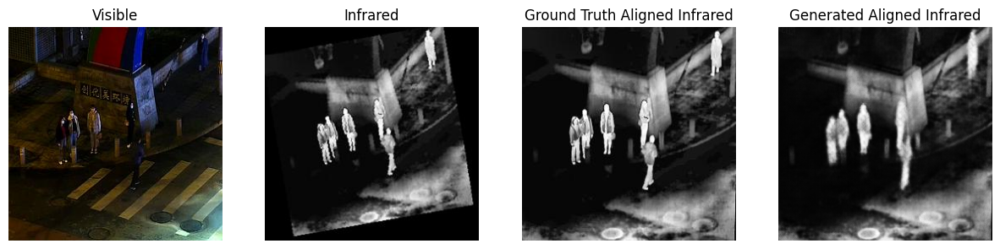

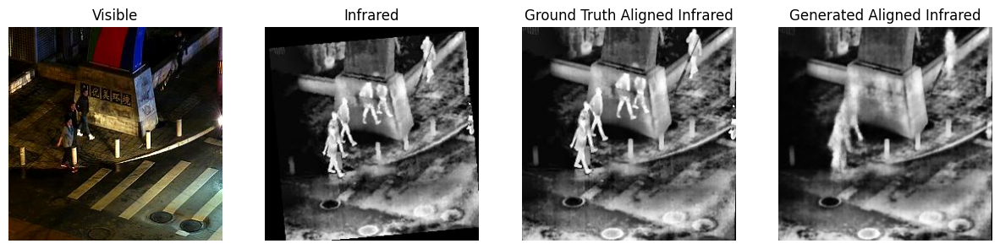

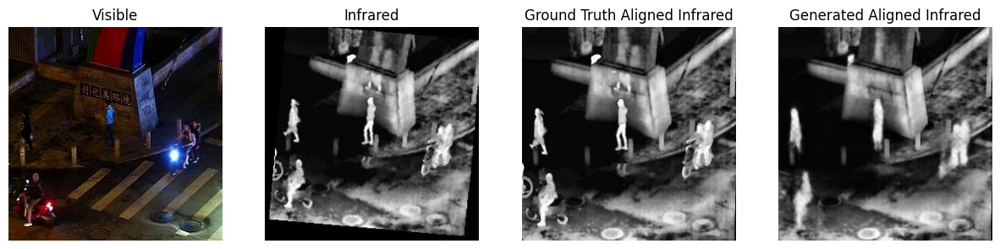

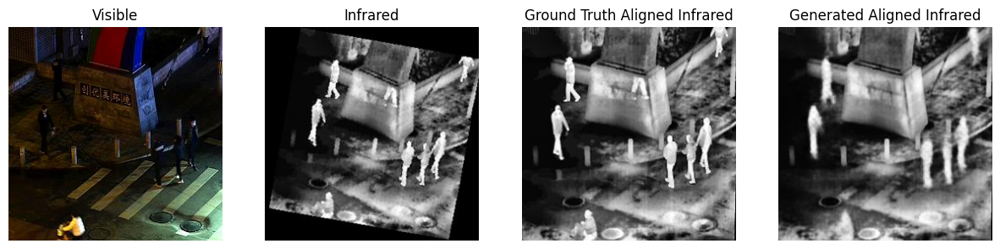

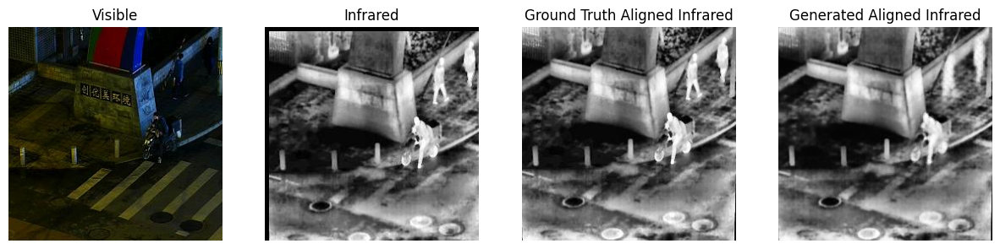

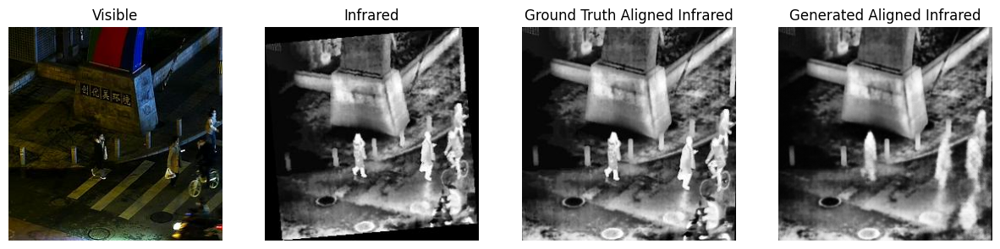

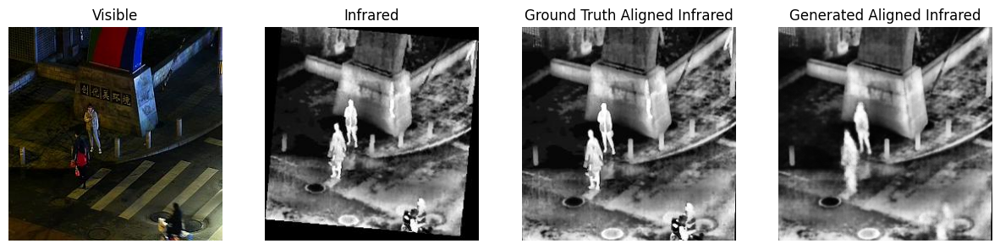

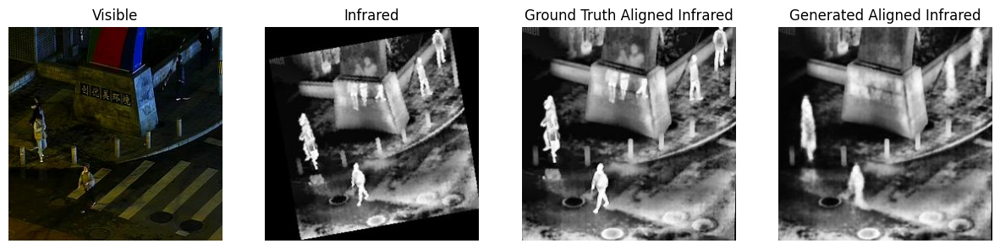

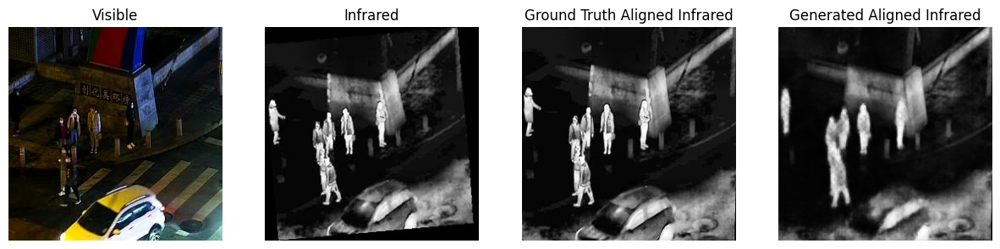

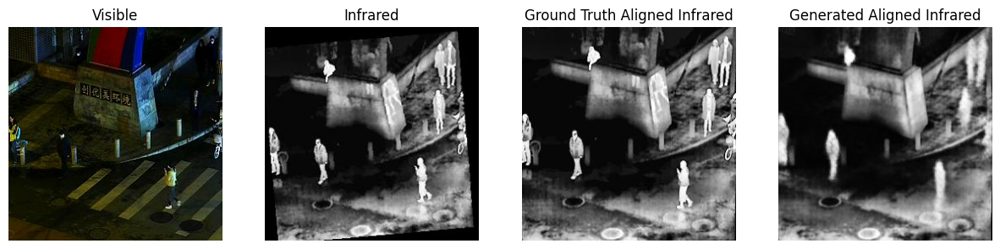

In [39]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

def visualize_results(generator, visible_images, infrared_images, ground_truth_images, device, num_samples=10, transform=None):
    """Visualizes the input visible, infrared, and generated aligned infrared images.

    Args:
        generator: The trained Generator model.
        visible_images: A list of file paths or tensors for visible images.
        infrared_images: A list of file paths or tensors for infrared images.
        ground_truth_images: A list of file paths or tensors for ground truth aligned infrared images.
        device: The device (CPU/GPU) where the model and tensors reside.
        num_samples: Number of samples to visualize.
        transform: Optional transform to apply when loading images.
    """
    generator.eval()  # Set the generator to evaluation mode

    transform = transform or transforms.Compose([transforms.ToTensor(), transforms.Normalize(mean=[0.5], std=[0.5])])

    with torch.no_grad():
        # Select a subset of samples to visualize
        for i in range(num_samples):
            visible = visible_images[i]
            infrared = infrared_images[i]
            ground_truth = ground_truth_images[i]

            # If inputs are paths, load the images
            if isinstance(visible, str):
                visible = Image.open(visible).convert('RGB')
                infrared = Image.open(infrared).convert('L')
                ground_truth = Image.open(ground_truth).convert('L')

                # Apply transforms to convert to tensors
                visible = transform(visible)
                infrared = transform(infrared)
                ground_truth = transform(ground_truth)

            # Add batch dimension and move to device
            visible = visible.unsqueeze(0).to(device)
            infrared = infrared.unsqueeze(0).to(device)
            ground_truth = ground_truth.unsqueeze(0).to(device)

            # Generate aligned infrared using the generator
            generated_infrared = generator(visible, infrared).cpu().squeeze(0)

            # Denormalize images for visualization (convert from [-1, 1] to [0, 1])
            def denormalize(tensor):
                return (tensor * 0.5 + 0.5).clamp(0, 1)

            visible = denormalize(visible.cpu().squeeze(0))
            infrared = denormalize(infrared.cpu().squeeze(0))
            ground_truth = denormalize(ground_truth.cpu().squeeze(0))
            generated_infrared = denormalize(generated_infrared)

            # Plot the images
            plt.figure(figsize=(15, 5))
            plt.subplot(1, 4, 1)
            plt.imshow(visible.permute(1, 2, 0))  # Convert [C, H, W] to [H, W, C]
            plt.title("Visible")
            plt.axis("off")

            plt.subplot(1, 4, 2)
            plt.imshow(infrared.permute(1, 2, 0), cmap="gray")  # Grayscale image
            plt.title("Infrared")
            plt.axis("off")

            plt.subplot(1, 4, 3)
            plt.imshow(ground_truth.permute(1, 2, 0), cmap="gray")  # Grayscale image
            plt.title("Ground Truth Aligned Infrared")
            plt.axis("off")

            plt.subplot(1, 4, 4)
            plt.imshow(generated_infrared.permute(1, 2, 0), cmap="gray")  # Grayscale image
            plt.title("Generated Aligned Infrared")
            plt.axis("off")

            plt.show()

# Example usage
visualize_results(generator, visible_images[0:12], infrared_images[0:12], aligned_infrared_images[0:12], device)


In [40]:
pip install torch torchvision scikit-image matplotlib


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\admin\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [54]:
import torch
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from torch.nn.functional import l1_loss

# Function to calculate evaluation metrics
def calculate_metrics(generated, ground_truth):
    """
    Calculate SSIM, PSNR, and MAE between two images
    """
    generated_np = generated.squeeze(0).cpu().numpy()  # Remove batch, move to CPU
    ground_truth_np = ground_truth.squeeze(0).cpu().numpy()

    # SSIM and PSNR (skimage requires images in range [0, 1])
    ssim_score = ssim(generated_np, ground_truth_np, data_range=1)
    psnr_score = psnr(ground_truth_np, generated_np, data_range=1)

    # MAE using PyTorch
    mae_score = l1_loss(torch.tensor(generated_np), torch.tensor(ground_truth_np)).item()
    return ssim_score, psnr_score, mae_score

# Visualize images and compute metrics
def evaluate_images(generator, dataloader, num_images=10):
    generator.eval()  # Set generator to evaluation mode
    with torch.no_grad():
        for idx, (visible, infrared, aligned_infrared) in enumerate(dataloader):
            if idx >= num_images:
                break

            visible, infrared, aligned_infrared = visible.to(device), infrared.to(device), aligned_infrared.to(device)
            generated_infrared = generator(visible, infrared)

            # Display the ground truth and generated images side by side
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            axes[0].imshow(aligned_infrared[0].cpu().squeeze(), cmap="gray")
            axes[0].set_title("Ground Truth")
            axes[1].imshow(generated_infrared[0].cpu().squeeze(), cmap="gray")
            axes[1].set_title("Generated Image")
            plt.show()

            # Calculate metrics
            ssim_score, psnr_score, mae_score = calculate_metrics(generated_infrared[0], aligned_infrared[0])
            print(f"Image {idx+1}:")
            print(f"SSIM: {ssim_score:.4f}, PSNR: {psnr_score:.2f} dB, MAE: {mae_score:.4f}\n")


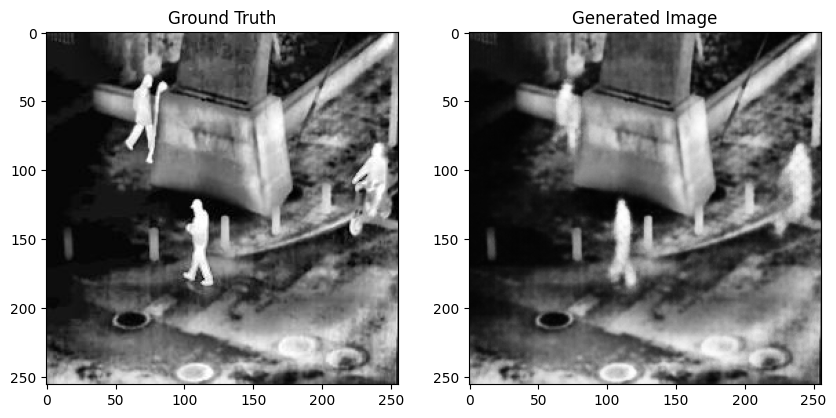

Image 1:
SSIM: 0.8034, PSNR: 18.35 dB, MAE: 0.0587



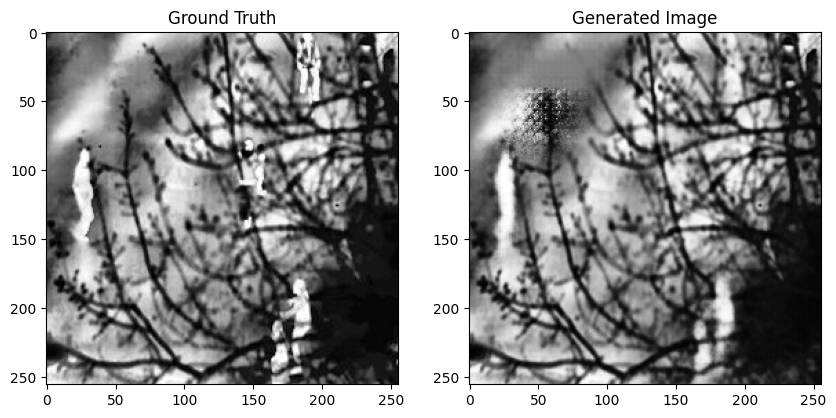

Image 2:
SSIM: 0.7683, PSNR: 16.37 dB, MAE: 0.0863



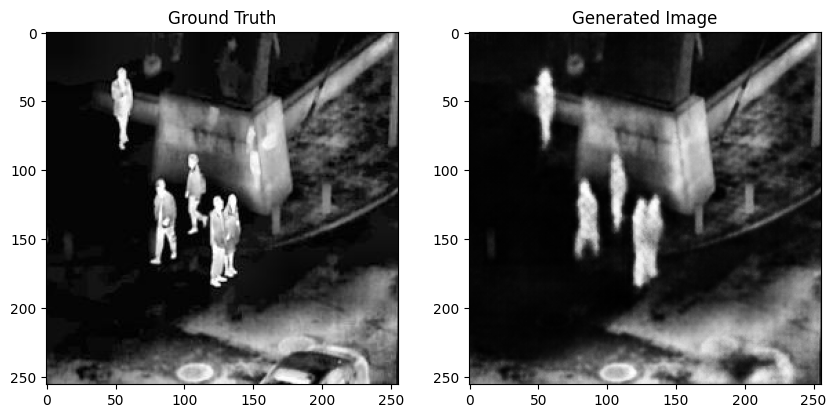

Image 3:
SSIM: 0.7403, PSNR: 17.48 dB, MAE: 0.0667



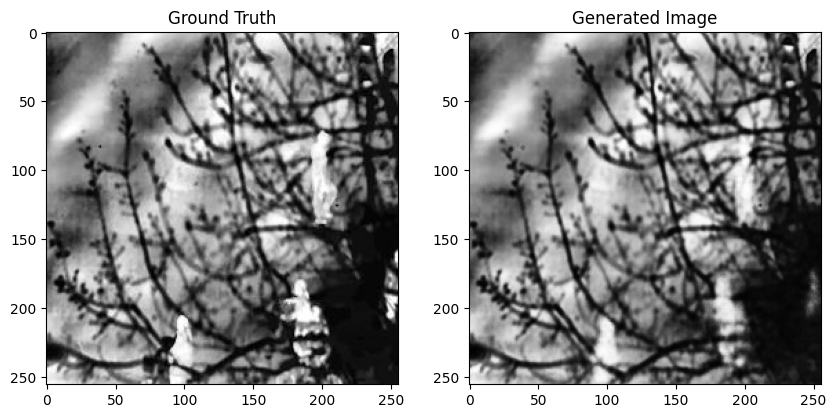

Image 4:
SSIM: 0.8367, PSNR: 17.76 dB, MAE: 0.0670



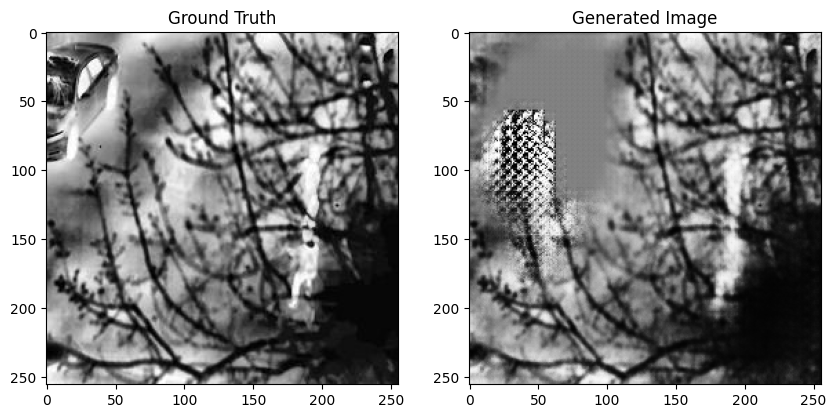

Image 5:
SSIM: 0.5514, PSNR: 10.67 dB, MAE: 0.1852



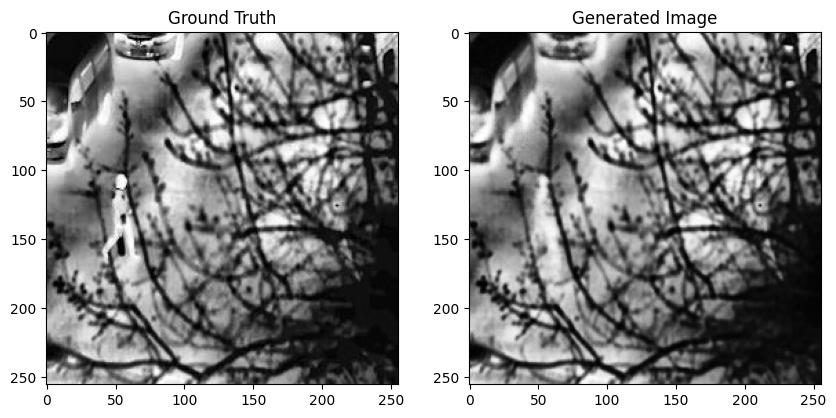

Image 6:
SSIM: 0.8755, PSNR: 20.56 dB, MAE: 0.0547



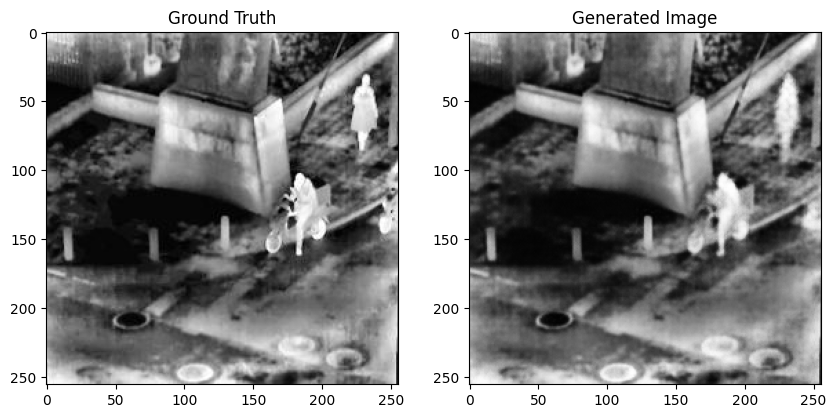

Image 7:
SSIM: 0.8086, PSNR: 20.09 dB, MAE: 0.0581



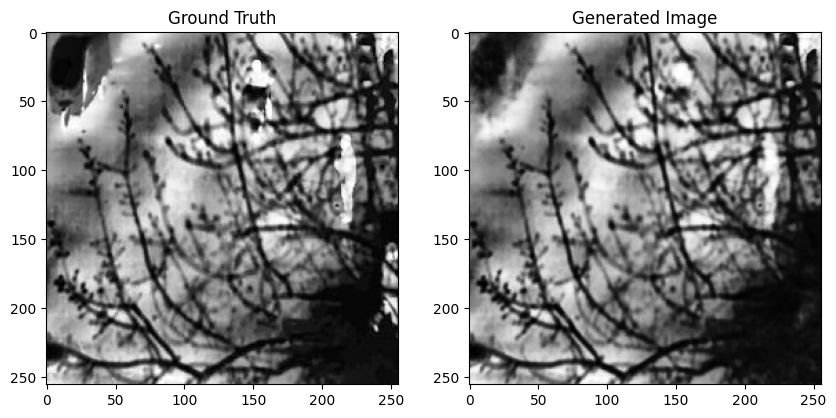

Image 8:
SSIM: 0.8204, PSNR: 16.93 dB, MAE: 0.0707



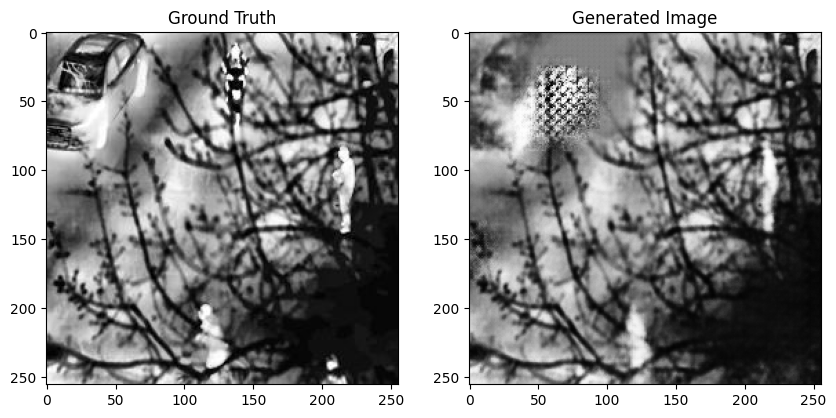

Image 9:
SSIM: 0.6789, PSNR: 12.98 dB, MAE: 0.1290



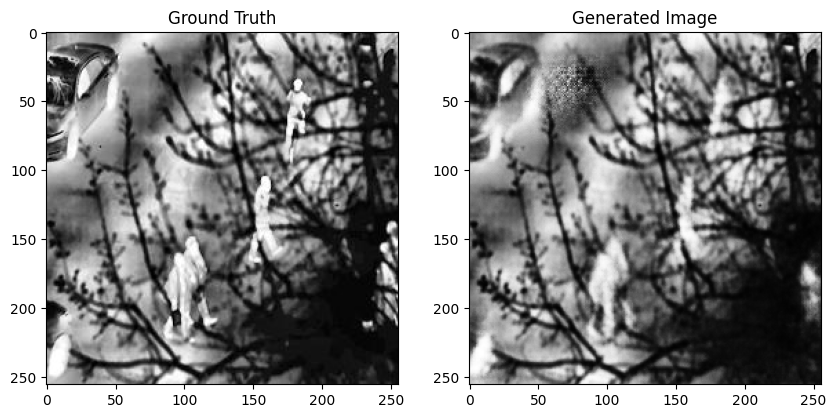

Image 10:
SSIM: 0.7714, PSNR: 15.60 dB, MAE: 0.0924



In [56]:
# Evaluate 10 images after training
evaluate_images(generator, train_loader, num_images=10)


TESTING

In [58]:
# Initialize the generator and discriminator
generator = Generator().to(device)
#discriminator = Discriminator().to(device)

# Load the trained weights
generator.load_state_dict(torch.load(r"D:\GAN\final dataset\generator_epoch_200.pth", map_location=device))  # Replace with the path to your saved generator weights
#discriminator.load_state_dict(torch.load(r"D:\GAN\final dataset\discriminator_epoch_200.pth", map_location=device))  # Replace with the path to your saved discriminator weights (if needed for evaluation)


# Set to evaluation mode
generator.eval()
#discriminator.eval()


Generator(
  (encoder): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
  )
  (residual_blocks): Sequential(
    (0): ResidualBlock(
      (block): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

In [62]:
from glob import glob
from PIL import Image

# Paths to your datasets
visible_image_dir = r'D:\GAN\final dataset\TEST\visi test p'
infrared_image_dir = r'D:\GAN\final dataset\TEST\infra test p'

#aligned_infrared_image_dir = '/content/drive/MyDrive/Btech project/Project_hsp/Test/infra_test_preprocessed

# Collect file paths
visible_images = sorted(glob(os.path.join(visible_image_dir, '*.jpg')))
infrared_images = sorted(glob(os.path.join(infrared_image_dir, '*.jpg')))
#aligned_infrared_images = sorted(glob(os.path.join(aligned_infrared_image_dir, '*.jpg')))

'''# Ensure the lengths of all lists match
assert len(visible_images) == len(infrared_images) == len(aligned_infrared_images), \
    "Mismatch in dataset sizes!" '''

print(f"Number of visible test images: {len(visible_images)}")
print(f"Number of unaligned infrared test images: {len(infrared_images)}")
#print(f"Number of aligned infrared images: {len(aligned_infrared_images)}")

import matplotlib.pyplot as plt

# Load the sample image
sample_visible_image = Image.open(visible_images[0])
sample_infrared_image = Image.open(infrared_images[0])
#sample_aligned_infrared_image = Image.open(aligned_infrared_images[0])


print(sample_visible_image.format ,sample_infrared_image.format)  # Should print 'JPEG', 'PNG', etc.
print(sample_visible_image.size ,sample_infrared_image.size)    # Prints the image size (width, height)


Number of visible test images: 200
Number of unaligned infrared test images: 200
JPEG JPEG
(256, 256) (256, 256)


In [63]:

import os
from PIL import Image
import torch
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import save_image


# Define paths to test directories
visible_test_dir = r'D:\GAN\final dataset\TEST\visi test p'
unregistered_ir_test_dir = r'D:\GAN\final dataset\TEST\unreg test'
aligned_ir_output_dir = r'D:\GAN\final dataset\TEST\generated test 3'  # Directory to save generated images


os.makedirs(aligned_ir_output_dir, exist_ok=True)  # Create output directory if it doesn't exist


# Preprocessing for images (consistent with training)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalizing to [-1, 1]
])


# Load your trained Generator model
generator = Generator().to(device)  # Assuming 'device' is already defined
generator.load_state_dict(torch.load(r'D:\GAN\final dataset\generator_epoch_200.pth', map_location=device))  # Load saved weights
generator.eval()  # Set to evaluation mode


# Testing loop
for image_name in sorted(os.listdir(unregistered_ir_test_dir)):
    if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Load visible and unregistered IR images
        visible_image_path = os.path.join(visible_test_dir, image_name)
        unregistered_ir_image_path = os.path.join(unregistered_ir_test_dir, image_name)

        visible_image = Image.open(visible_image_path).convert('RGB')  # Load visible image
        unregistered_ir_image = Image.open(unregistered_ir_image_path).convert('L')  # Load unregistered IR image

        visible_image = transform(visible_image).unsqueeze(0).to(device)  # Apply transforms and move to device
        unregistered_ir_image = transform(unregistered_ir_image).unsqueeze(0).to(device)  # Apply transforms and move to device

        # Generate aligned IR image
        with torch.no_grad():
            aligned_ir_image = generator(visible_image, unregistered_ir_image).squeeze(0).cpu()

        # Save the generated aligned IR image
        output_path = os.path.join(aligned_ir_output_dir, image_name)
        save_image(aligned_ir_image, output_path)  # Save using save_image (from torchvision.utils)
        print(f"Generated and saved aligned image: {output_path}")


print(f"Aligned IR images generated and saved to {aligned_ir_output_dir}")



Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010301.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010302.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010303.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010304.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010305.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010306.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010307.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010308.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010309.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010310.jpg
Generated and saved aligned image: D:\GAN\final dataset\TEST\generated test 3\010311.jpg
Generated and saved a

In [ ]:
'''import os
from PIL import Image
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.utils import save_image

# Define paths to test directories
visible_test_dir = r'D:\GAN\final dataset\viisble test preprocessed'
unregistered_ir_test_dir = r'D:\GAN\final dataset\unregistered test'
aligned_ir_output_dir = r'D:\GAN\final dataset\generated test dis'  # Directory to save generated images

os.makedirs(aligned_ir_output_dir, exist_ok=True)  # Create output directory if it doesn't exist

# Preprocessing for images (consistent with training)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalizing to [-1, 1]
])

# Initialize the generator and discriminator
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Load the trained weights
generator.load_state_dict(torch.load(r"D:\GAN\final dataset\generator_epoch_200.pth", map_location=device))
discriminator.load_state_dict(torch.load(r"D:\GAN\final dataset\discriminator_epoch_200.pth", map_location=device))

# Set models to evaluation mode
generator.eval()
discriminator.eval()

# Testing loop
for image_name in sorted(os.listdir(unregistered_ir_test_dir)):
    if image_name.lower().endswith(('.png', '.jpg', '.jpeg')):
        # Load visible and unregistered IR images
        visible_image_path = os.path.join(visible_test_dir, image_name)
        unregistered_ir_image_path = os.path.join(unregistered_ir_test_dir, image_name)

        visible_image = Image.open(visible_image_path).convert('RGB')  # Load visible image
        unregistered_ir_image = Image.open(unregistered_ir_image_path).convert('L')  # Load unregistered IR image

        # Apply transforms and move to device
        visible_image = transform(visible_image).unsqueeze(0).to(device)
        unregistered_ir_image = transform(unregistered_ir_image).unsqueeze(0).to(device)

        # Generate aligned IR image
        with torch.no_grad():
            aligned_ir_image = generator(visible_image, unregistered_ir_image).squeeze(0).cpu()

            # Evaluate with discriminator
            fake_input = torch.cat([visible_image, aligned_ir_image.unsqueeze(0)], dim=1)  # Adjust input dimensions if needed
            discriminator_score = discriminator(fake_input).item()  # Get discriminator score

        # Save the generated aligned IR image
        output_path = os.path.join(aligned_ir_output_dir, image_name)
        save_image(aligned_ir_image, output_path)
        print(f"Generated and saved aligned image: {output_path} | Discriminator Score: {discriminator_score}")

print(f"Aligned IR images generated and saved to {aligned_ir_output_dir}")'''


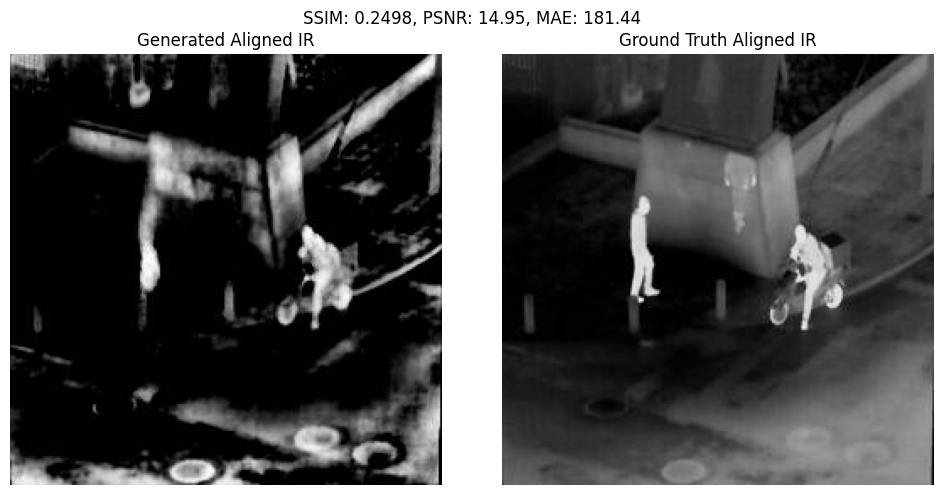

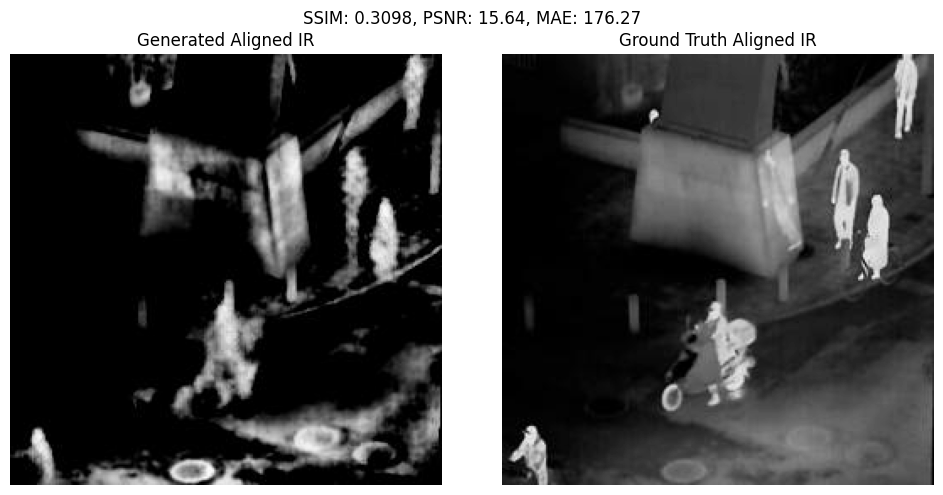

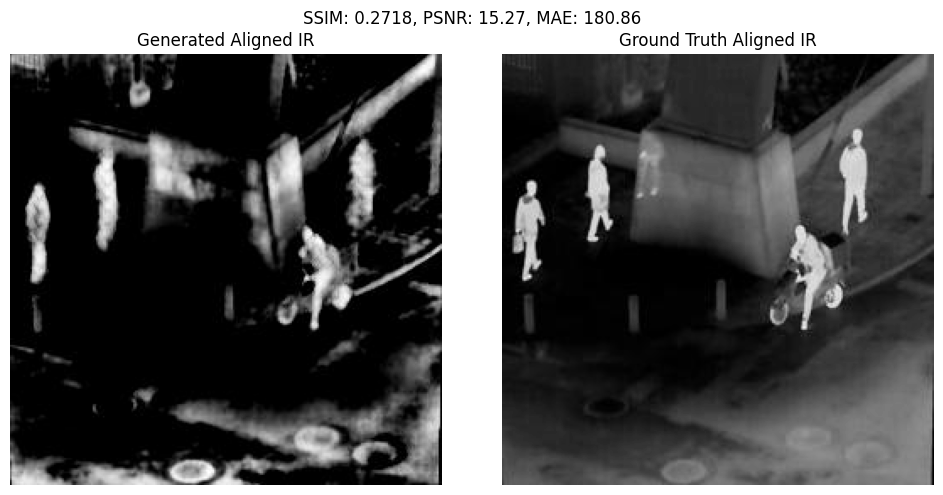

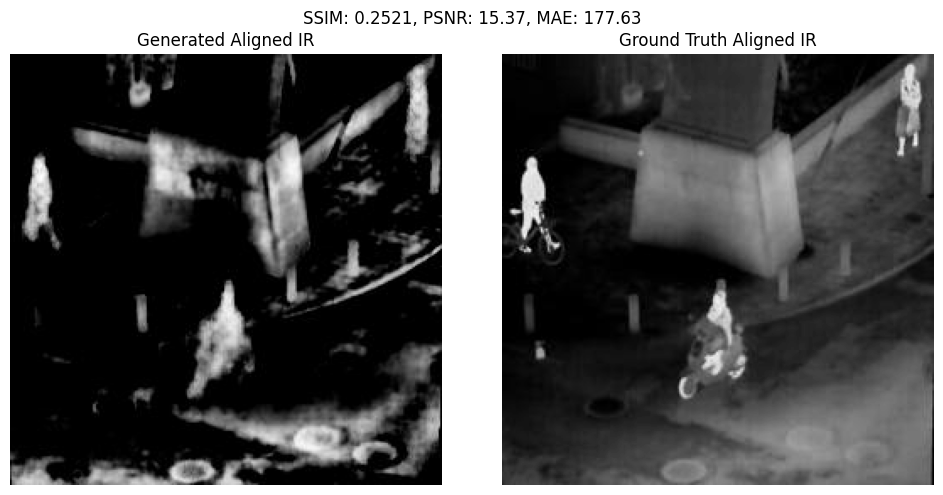

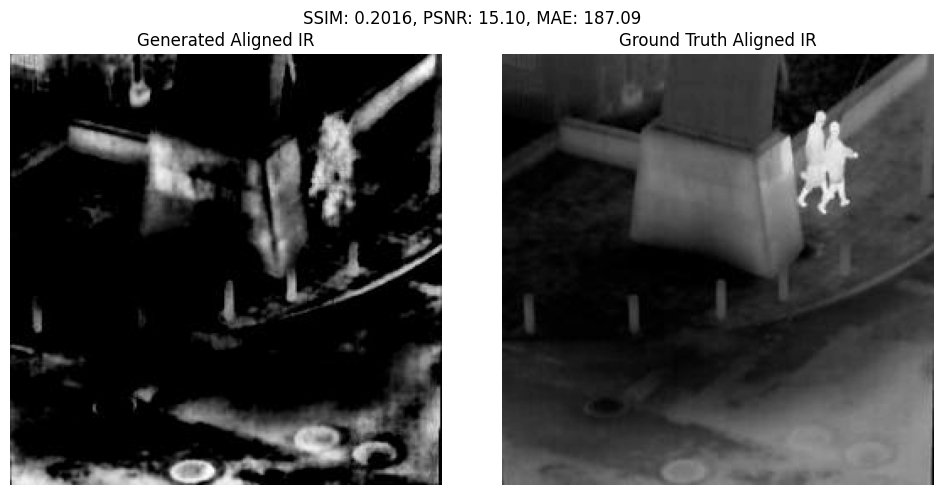

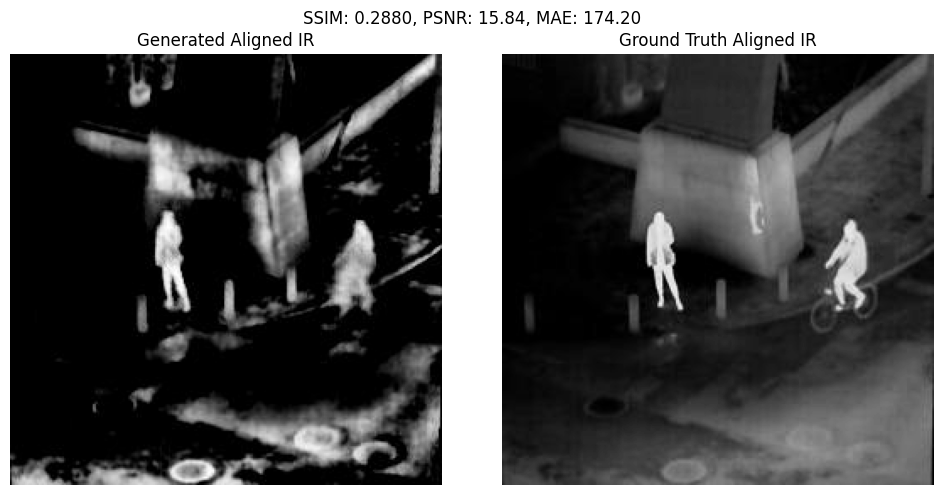

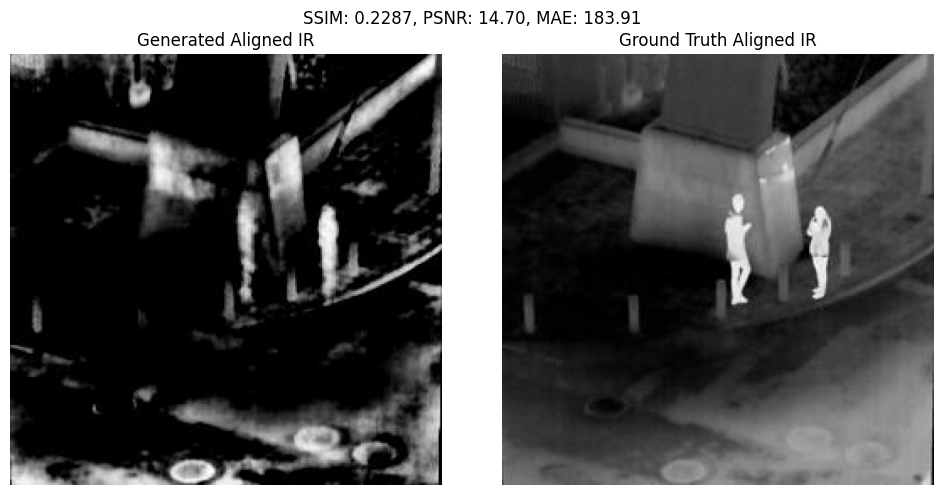

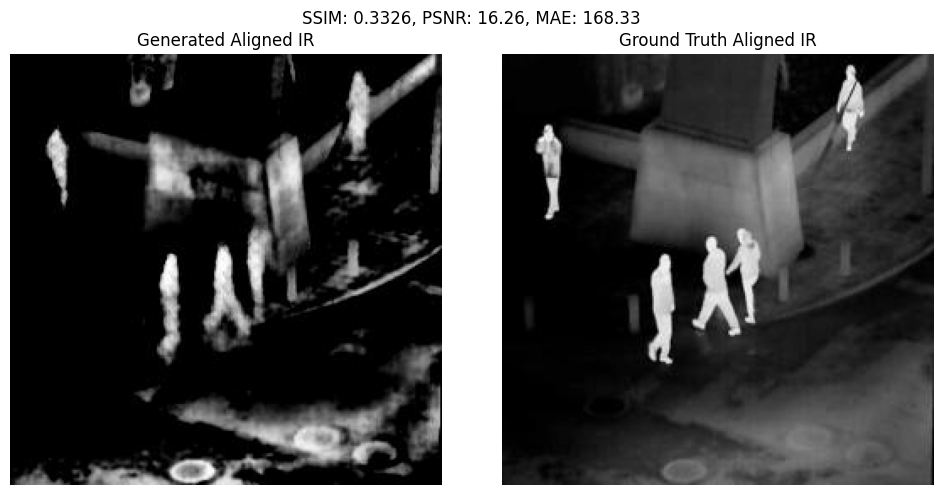

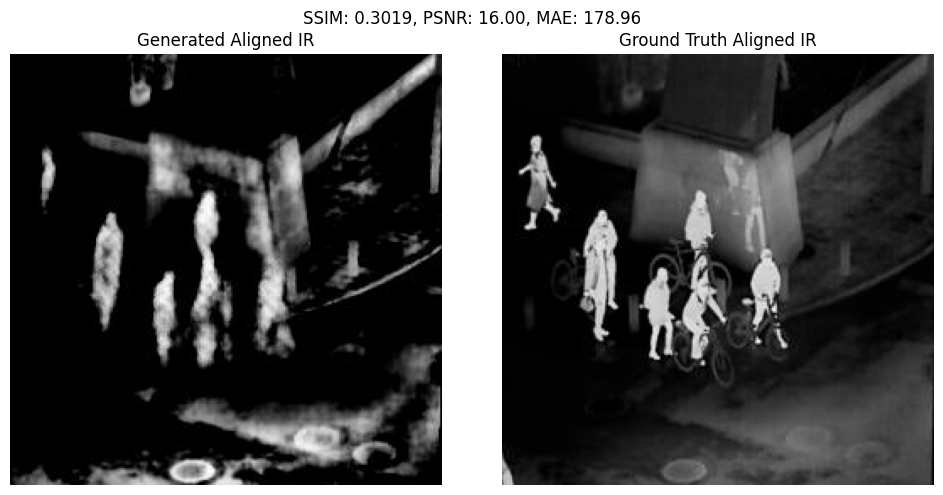

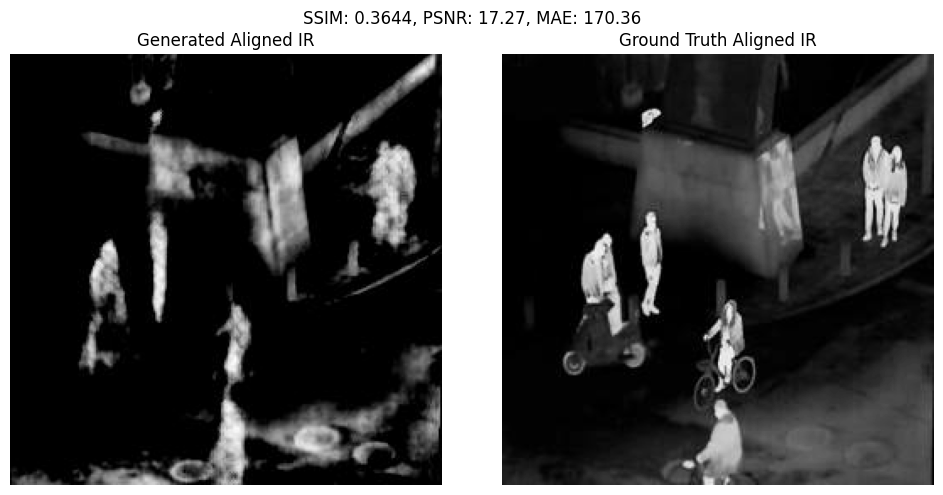

=== Overall Metrics for Testing Set ===
Average SSIM: 0.2801
Average PSNR: 15.64
Average MAE: 177.90


In [67]:
import os
from skimage.metrics import structural_similarity as ssim, peak_signal_noise_ratio as psnr
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def calculate_metrics(image1_path, image2_path):
    """
    Calculate SSIM, PSNR, and MAE between two images.

    Args:
        image1_path: Path to the first image (generated aligned IR).
        image2_path: Path to the second image (ground truth aligned IR).
    
    Returns:
        A dictionary with SSIM, PSNR, and MAE values.
    """
    # Load images and convert to grayscale
    image1 = np.array(Image.open(image1_path).convert('L'))
    image2 = np.array(Image.open(image2_path).convert('L'))

    # Calculate metrics
    ssim_score = ssim(image1, image2, data_range=image1.max() - image1.min())
    psnr_score = psnr(image1, image2, data_range=image1.max() - image1.min())
    mae_score = np.mean(np.abs(image1 - image2))

    return {"SSIM": ssim_score, "PSNR": psnr_score, "MAE": mae_score}

def display_images_and_metrics(image1_path, image2_path, metrics):
    """
    Display two images side-by-side and show metrics.

    Args:
        image1_path: Path to the first image.
        image2_path: Path to the second image.
        metrics: Dictionary containing SSIM, PSNR, and MAE.
    """
    # Load images
    image1 = np.array(Image.open(image1_path).convert('L'))
    image2 = np.array(Image.open(image2_path).convert('L'))

    # Plot the images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(image1, cmap='gray')
    axes[0].set_title("Generated Aligned IR")
    axes[0].axis('off')

    axes[1].imshow(image2, cmap='gray')
    axes[1].set_title("Ground Truth Aligned IR")
    axes[1].axis('off')

    # Display metrics
    plt.suptitle(f"SSIM: {metrics['SSIM']:.4f}, PSNR: {metrics['PSNR']:.2f}, MAE: {metrics['MAE']:.2f}", fontsize=12)
    plt.tight_layout()
    plt.show()

def evaluate_testing_images(generated_dir, ground_truth_dir, num_images=10):
    """
    Evaluate multiple images and display metrics.

    Args:
        generated_dir: Directory containing generated aligned IR images.
        ground_truth_dir: Directory containing ground truth images.
        num_images: Number of image pairs to evaluate.
    """
    # Get sorted file lists to match corresponding images
    generated_images = sorted(os.listdir(generated_dir))[:num_images]
    ground_truth_images = sorted(os.listdir(ground_truth_dir))[:num_images]

    # Lists to store overall metrics
    overall_metrics = {"SSIM": [], "PSNR": [], "MAE": []}

    for gen_img, gt_img in zip(generated_images, ground_truth_images):
        gen_path = os.path.join(generated_dir, gen_img)
        gt_path = os.path.join(ground_truth_dir, gt_img)

        # Calculate metrics
        metrics = calculate_metrics(gen_path, gt_path)
        overall_metrics["SSIM"].append(metrics["SSIM"])
        overall_metrics["PSNR"].append(metrics["PSNR"])
        overall_metrics["MAE"].append(metrics["MAE"])

        # Display images with their metrics
        display_images_and_metrics(gen_path, gt_path, metrics)

    # Print average metrics for all images
    print("=== Overall Metrics for Testing Set ===")
    print(f"Average SSIM: {np.mean(overall_metrics['SSIM']):.4f}")
    print(f"Average PSNR: {np.mean(overall_metrics['PSNR']):.2f}")
    print(f"Average MAE: {np.mean(overall_metrics['MAE']):.2f}")

# Directories containing the testing images
generated_dir = r"D:\GAN\final dataset\TEST\generated test 2"
ground_truth_dir = r"D:\GAN\final dataset\TEST\infra test p"

# Evaluate testing images
evaluate_testing_images(generated_dir, ground_truth_dir, num_images=10)
